# Phys 481 Fall 2021 Assignment 4: The Ising Model
### A.G. Swadling (30098501)
### E.J. Thompson (30087678)
### G.J. Gelinas (30085897)
### T.J. Cey (30088060)

In [14]:
# load libraries for numerical methods and plotting
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Load libraries for animation and integration
from matplotlib import animation, rc
from IPython.display import HTML, display
import scipy.integrate

## Introduction

In this assignment we sought to investigate the one-dimensional wave equation through numerical finite difference methods. The one dimensional wave equation is a partial differential equation of the form \begin{equation} \frac{\partial^2u}{\partial t^2} = c^2\frac{\partial^2u}{\partial x^2}\end{equation} where $u(x,t)$ is a real-valued multivariate function of position and time describing the height or magnitude of the wave, and $c$ is the propagation speed of the wave. Further, we consider the wave to be restricted to some fixed interval $[0,L]$, with either cyclic, free, or strict boundaries at the ends. These boundary conditions correspond respectively to a wave which will pass from one side to the other unimpeded, a wave which will reflect off of a free boundary on either end, as in the case of a wave on a string with a massless ring at the end which is allowed to move up and down without restriction, and a fixed point boundary which will cause the wave to flip upon reflection.

To fully specify the solution to a partial differential equation of this form we need to specify initial conditions, boundary conditions, or in some cases both. An initial condition is given by a function $I(x)$ or $V(x)$ of position or velocity such that at time $t = 0\;s$, either $u(x,0) = I(x)$ or $\frac{\partial u}{\partial t}(x,0) = V(x)$ for all $x \in [0,L]$. A boundary condition is a value for which we specify the endpoints of our interval stay at for all times, such as \begin{equation*}
\left.\begin{array}{c} u(0,t) = c_0 \\ u(L,t) = c_L \end{array}\right\}\;t \in [0,T]
\end{equation*}
where $T$ is the time we are interested in the waves behaviour.

In our first task we aimed to construct a function which could compute the energy of our solution to the wave equation, which is given exactly by \begin{equation*} 
E(t) = \frac{1}{2}\int_0^L[u_t(x,t)^2+c^2u_x(x,t)^2]dx
\end{equation*}
In the second task we tested our result for a simple Gaussian wave pulse with cyclic boundary conditions, and then in our third task we implemented free boundaries and tested whether for such boundary conditions the energy of the numerical solution to the wave equation would still be conserved.

Finally, in an optional investigation we simulated various standing waves in the interval $[0,L]$, and investigated the error between the analytic and numerical solutions using a number of graphical techniques.

## Task 1


## Task 2


## Task 3


## Optional: Standing Waves

The purpose of this code is to simulate a standing wave using numerical finite difference methods as well as the analytic solution before analyzing the error in our numerical approach. In particular we consider the case of a standing wave of amplitude $A = 1$ with harmonic $m = 3$ confined in a region $[0,L]$ where $L = 1$, and we also investigate the case of a high Courant number.

In [15]:
# This function is made from a few alterations to the wave_stepper function in phys481_week10_wave_equation-notes
def wave_stepper(u, dt, init_vel = 0, Courant=0.1, nsteps=99, save_stride=9, free = False, boundary_hack=False):
    """Iterates the numerical finite difference method for the 1D-wave equation with
    initial condition u. If free is true then the boundaries are considered to be 
    free rings allowing the wave to ride up and down. If boundary_hack is true and
    free is false the boundaries are considered to be fixed points so the wave reverses
    its orientation upon reflection. Otherwise cyclic boundaries are used.
    
    Arguments:
    u -- the initial wave heights
    dt -- the size of the time step
    init_vel -- array of initial wave velocities, or zero if no array is given
    Courant -- the Courant constant for the numerical solution = wave_speed*dt/dx
    nsteps -- number of steps for the numerical solution
    save_stride -- number of iterations between saves of the wave height
    free -- boolean for if there is a free boundary at the ends of the interval
    boundary_hack -- boolean for if there is a strict boundary at the ends of the interval
    
    Result:
    result -- an array of wave heights at various times
    """
    
    # Initializes the current and next wave heights
    u_cur = u.copy()
    u_next = 0*u.copy()
    
    # spatial second derivative difference equation assuming 
    # cyclic ("wrap-around") boundaries
    d2u = lambda u: np.roll(u,-1) - 2*u + np.roll(u,+1)
    
    # Initializes the previous wave height
    u_last = u_cur - dt*init_vel + 0.5*Courant**2*d2u(u_cur)
    
    # Applies the appropriate boundary conditions based on the inputted booleans
    if free:
        # Apply free boundary conditions
        u_next[0] = -u_last[0]+2*u_cur[0]+2*Courant**2*(u_cur[1]-u_cur[0])
        u_next[-1] = -u_last[-1]+2*u_cur[-1]+2*Courant**2*(u_cur[-2]-u_cur[-1])
    elif boundary_hack:
        # Applies fixed boundary conditions
        u_next[0], u_next[-1] = 0, 0
    
    
    # Initialize a list for holding wave heights at various times
    result = []
    
    # Iterates the numerical wave solution nsteps number of times
    for n in range(nsteps):
        
        # Obtains the next wave height using finite differences
        u_next = 2*u_cur - u_last + Courant**2*d2u(u_cur)
        
        # Applies the appropriate boundary conditions based on the inputted booleans
        if free:
            # Apply free boundary conditions
            u_next[0] = -u_last[0]+2*u_cur[0]+2*Courant**2*(u_cur[1]-u_cur[0])
            u_next[-1] = -u_last[-1]+2*u_cur[-1]+2*Courant**2*(u_cur[-2]-u_cur[-1])
        elif boundary_hack:
            # Applies fixed boundary conditions
            u_next[0], u_next[-1] = 0, 0
                 
        # Sets previous = current wave height
        u_last = u_cur[:]  
        #  Sets current = next wave height
        u_cur = u_next[:] 
        
        # save results at every save_stride-th time step for analysis and display
        if (n%save_stride)==0: result.append(u_cur.copy())
    
    return result

In [16]:
# This function is made from minor alterations to the wave_solver function in phys481_week10_wave_equation-notes
def wave_solver(u, xsteps, tsteps, wave_speed=1.0, save_stride=1, free = False, boundary_hack=False):
    """Obtains a solution to the wave equation with a given initial condition
    and boundary conditions.
    
    Arguments:
    u -- initial wave heights
    xsteps -- array of x coordinates
    tsteps -- array of times coordiantes
    wave_speed -- the speed of the wave
    save_stride -- number of iterations between saves of the wave height
    free -- boolean for if there is a free boundary at the ends of the interval
    boundary_hack -- boolean for if there is a strict boundary at the ends of the interval
    
    Result:
    result -- an array of wave heights at various times
    """
    
    # Obtains the time and distance step sizes
    dt = tsteps[1] - tsteps[0]
    dx = xsteps[1] - xsteps[0]
    
    # Obtains the Courant number
    C = wave_speed * dt / dx
    
    # Prints a warning if the Courant number is too large
    if (C>0.95):
        print('Warning- large Courant number: '+str(C)[0:4])
    
    # Obtains an array of wave heights at certain time steps
    result = wave_stepper(u, dt, Courant = C, nsteps = len(tsteps), save_stride=save_stride, 
                        free = free, boundary_hack=boundary_hack )
    
    return result

In [61]:
def wave_ani(L, amp, wave_funcs, wave_labels, title, *args, frames = 100, interval = 20, **kwargs):
    """Animates a collection of wave functions on the same grid.
    
    Arguments:
    L -- the length of the region containing the wave
    amp -- the amplitude of the wave
    wave_funcs -- the functions for the various waves
    wave_func2 -- the function describing the second wave
    wave_labels -- list of wave function labels
    title -- title of the animation
    *args -- the primary arguments of the wave function
    frames -- the number of frames in the animation
    interval -- the interval between frames
    **kwargs -- the keyword arguments of the wave function
    """
    
    # Obtains a list of triples of wave heights, arrays of x values, and arrays of time values for 
    # the given wave functions and parameters
    wave_triple = [wave_func(*args, **kwargs) for wave_func in wave_funcs]
    
    # Initialize plotting axes
    fig, axes = plt.subplots()
    axes.set_xlim(0.0, L)
    axes.set_xlabel("x-coordinate (m)")
    axes.set_ylabel("Amplitude (m)")
    axes.set_title(title)
    line, = axes.plot([], [], lw=2)
    
    # Initializes min and max limits for the y axis
    y_lims = [-amp, amp]
    
    # Initializes a list for storing line objects
    lines = []
    
    for index in range(len(wave_funcs)):
        # Initialize line object for animating
        line, = axes.plot([], [], lw=2, label = f"{wave_labels[index]} Wave")
        lines.append(line)

    # Adds a legend to the plot
    plt.legend()
    
    def init():
        """Initialization function for the FuncAnimation method"""
        for line in lines:
            line.set_data([],[])
        return lines
        
    def animate(i):
        """Animate function for the FuncAnimation function"""
        
        for func_index in range(len(wave_funcs)):
            # Sets the data with the x-array and wave_height array, in positions
            # 1 and 0 respectively, taking the ith time step of the wave heights
            lines[func_index].set_data(wave_triple[func_index][1], wave_triple[func_index][0][i])
            
            # If there is a wave height larger than y_max, increase it
            if np.max(wave_triple[func_index][0][i]) > y_lims[1]:
                y_lims[1] = np.max(wave_triple[func_index][0][i])
                
            # If there is a wave height smaller than y_min, decrease it
            if np.min(wave_triple[func_index][0][i]) < y_lims[0]:
                y_lims[0] = np.min(wave_triple[func_index][0][i])
        
        # Sets the limits of the y axis
        axes.set_ylim(y_lims[0],y_lims[1])
        return lines

    # Obtains the frames of the animation
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=interval, 
                                   blit=False)
    # Animates the result
    display(HTML(anim.to_jshtml()))
    # Closes the plot so the last frame doesn't display
    plt.close()

In [57]:
def surface_Plot(L, amp, wave_func, title, *args, **kwargs):
    """Plots a wave through time as a 3D-surface.
    
    Arguments:
    L -- the length of the region containing the wave
    amp -- the amplitude of the wave
    wave_func -- the function describing the wave
    title -- the title of the surface plot
    *args -- the primary arguments of the wave function
    **kwargs -- the keyword arguments of the wave function
    """
    
    # Obtains the wave height, array of x values, and array of time values for 
    # the given wave function and parameters
    wave_heights, xsteps, tsteps = wave_func(*args, **kwargs)
    
    # Turns the wave height and x and time coordinates into appropriately sized arrays for plotting
    wave_heights = np.array(wave_heights)
    XX,TT = np.meshgrid( xsteps, tsteps )

    # Initializes the 3D figure and plots the wave over time
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface( XX, TT, np.array(wave_heights), cmap=plt.cm.coolwarm)
    
    # Adds a colorbar and labels, and sets the orientation of the axes
    plt.colorbar(surf, shrink=0.5)
    ax.view_init(30, 30)
    ax.set_xlabel('x-coordinate (m)')
    ax.set_ylabel('t-coordinate (s)')
    ax.set_title(title)

In [58]:
def contour_Plot(L, amp, wave_func, title, *args, **kwargs):
    """Plots a wave through time as a 3D-surface.
    
    Arguments:
    L -- the length of the region containing the wave
    amp -- the amplitude of the wave
    wave_func -- the function describing the wave
    title -- the title of the contour plot
    *args -- the primary arguments of the wave function
    **kwargs -- the keyword arguments of the wave function
    """
    
    # Obtains the wave height, array of x values, and array of time values for 
    # the given wave function and parameters
    wave_heights, xsteps, tsteps = wave_func(*args, **kwargs)
    
    # Turns the wave height and x and time coordinates into appropriately sized arrays for plotting
    wave_heights = np.array(wave_heights)
    XX,TT = np.meshgrid( xsteps, tsteps )

    # Initializes the 3D figure and plots the wave over time
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    surf = ax.contourf( XX, TT, np.array(wave_heights), 20, cmap=plt.cm.coolwarm)
    
    # Adds a colorbar and labels, and sets the orientation of the axes
    plt.colorbar(surf, shrink=0.5)
    ax.set_xlabel('x-coordinate (m)')
    ax.set_ylabel('t-coordinate (s)')
    ax.set_title(title)

In [59]:
def numericStandingWave(A, L, T, harmonic = 1, Nxsteps = 199, Ntsteps = 9999, wave_speed=1.0, save_stride=20):
    """Obtains the numerical solution for a standing wave along a string
    of length L and over a time T.
    
    Arguments:
    A -- the amplitude of the wave
    L -- the length of the region containing the wave
    T -- the amount of time we calculate the wave's behaviour
    harmonic -- the harmonic for the standing wave
    Nxsteps -- the number of steps for the x array
    Ntsteps -- the number of steps for the time array
    wave_speed -- the wave_speed
    save_stride -- the number of iterations between saves of the wave height
    
    Results:
    wave_heights -- an array of wave heights at equally spaced times
    xsteps -- array of x coordinates
    tsteps -- array of times
    """
    
    # Obtains x and time axes
    xsteps = np.linspace(0.0, L, Nxsteps)
    tsteps = np.linspace(0.0, T, Ntsteps)
    
    # Initializes the initial shape of the standing wave
    u = A*np.sin(harmonic*np.pi*xsteps/L)
    
    # Obtains the solution of the wave equation over the specified time
    wave_heights = wave_solver(u, xsteps, tsteps, wave_speed=wave_speed, save_stride=save_stride, 
                                  free = False, boundary_hack=True)
    
    return wave_heights, xsteps, tsteps

In [49]:
def analyticStandingWave(A, L, T, harmonic = 1, Nxsteps = 199, Ntsteps = 9999, wave_speed=1.0, save_stride=20):
    """Obtains the analytic solution for a standing wave along a string
    of length L and over a time T.
    
    Arguments:
    A -- the amplitude of the wave
    L -- the length of the region containing the wave
    T -- the amount of time we calculate the wave's behaviour
    harmonic -- the harmonic for the standing wave
    Nxsteps -- the number of steps for the x array
    Ntsteps -- the number of steps for the time array
    wave_speed -- the wave_speed
    save_stride -- the number of iterations between saves of the wave height
    
    Results:
    wave_heights -- an array of wave heights at equally spaced times
    xsteps -- array of x coordinates
    tsteps -- array of times
    """
    
    # Initializes a function for the numerical solution
    u_func = lambda x, t: A*np.sin(harmonic*np.pi*x/L)*np.cos(harmonic*np.pi*wave_speed*t/L)
    
    # Obtains x and time axes
    xsteps = np.linspace(0.0, L, Nxsteps)
    tsteps = np.linspace(0.0, T, Ntsteps)
    
    # Initializes a list for storing wave heights for various times
    wave_heights = []
    
    # Iterates the wave height over time, storing specified iteration steps
    for n in range(Ntsteps):
        
        # Obtains the next set of wave heights
        u_cur = u_func(xsteps, tsteps[n])
        
        # save results at every save_stride-th time step for analysis and display
        if (n%save_stride)==0: wave_heights.append(u_cur.copy())
    
    
    return wave_heights, xsteps, tsteps

In [50]:
def error_Func(analytic, numerical, *args, **kwargs):
    """Obtains an error function for a pair of analytic and
    numerical solutions with given arguments and key-word arguments.
    
    Arguments:
    analytic -- the analytical solution function for the wave equation
    numerical -- the numerical solution function for the wave equation
    *args -- the arguments of the solution functions
    **kwargs -- the keyword arguments of the solution functions
    
    Returns:
    error -- a function returning the difference between the numerical and analytic solutions
    """
    
    def error(*args, **kwargs):
        """Error function which returns the difference in wave heights
        and the step arrays for the x and time directions.
        
        Arguments:
        *args -- the arguments of the solution functions
        **kwargs -- the keyword arguments of the solution functions

        Returns:
        np.array(analytic_heights) - np.array(numerical_heights) -- the difference in the numerical and analytic wave heights
        analytic_xsteps -- an array of x-coordinates
        analytic_tsteps -- an array of times
        """
        
        # Obtains the analytic and numerical wave heights over time as well as their x and time steps
        analytic_heights, analytic_xsteps, analytic_tsteps = analytic(*args, **kwargs)
        numerical_heights, numerical_xsteps, numerical_tsteps = numerical(*args, **kwargs)
        
        
        return np.array(analytic_heights) - np.array(numerical_heights), analytic_xsteps, analytic_tsteps
    
    return error

In [51]:
def mainPlot(L, amp, *args, frames = 100, interval = 20, **kwargs):
    """Animates the wave and its error, and plots the error of the numerical
    solution through time as a 3D plot and a contour plot.
    
    Arguments:
    L -- the length of the region containing the wave
    amp -- the amplitude of the wave
    *args -- the primary arguments of the wave function
    frames -- the number of frames in the animation
    interval -- the interval between frames
    **kwargs -- the keyword arguments of the wave function
    """
    
    # Animates the analytic and numerical standing waves on the same plot
    wave_ani(L, amp, [analyticStandingWave, numericStandingWave], ["Analytic", "Numerical"],
                  "Numerical and Analytic Standing Wave Comparison", *args, frames = frames, interval = interval, **kwargs)
    
    # Obtains a function for the error in the numerical standing wave
    standingError = error_Func(analyticStandingWave, numericStandingWave, *args, **kwargs)
    
    # Plots the animation of the error in the numerical standing wave
    wave_ani(L, amp/100, [standingError], ["Error"], "Numerical Solution Error in Time", *args, 
             frames = frames, interval = interval, **kwargs)
    
    # Replaces the save_stride with 1 for plotting
    kwargs["save_stride"] = 1
    
    # Plots the error in the standing wave as a surface and contour plot
    surface_Plot(L, amp, standingError, "Numerical Standing Wave Error", *args, **kwargs)
    contour_Plot(L, amp, standingError, "Numerical Standing Wave Error", *args, **kwargs)

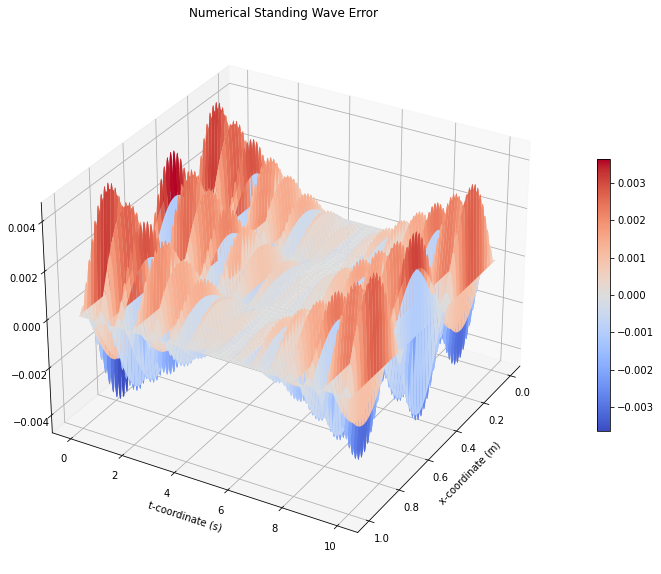

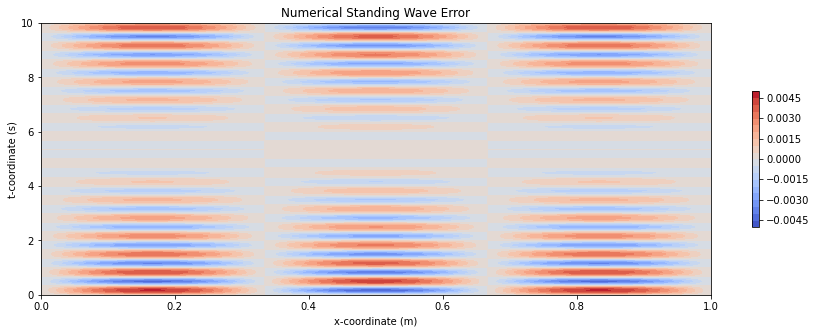

In [36]:
# Plots and animates numeric and analytic standing waves with amplitude 1, length 1, and harmonic 3
args1 = [1.0, 1.0, 10.0]
kwargs1 = {"harmonic" : 3, "Nxsteps" : 199, "Ntsteps" : 20000, "wave_speed" : 1.0, "save_stride" : 20}

mainPlot(1.0, 1.0, *args1, frames = 100, interval = 20, **kwargs1)

In the first animation we see the numerical and analytical solutions for the third harmonic of a standing wave nearly perfectly overlap, although in between the peaks we can see a slight difference in the waves. But, upon closer inspection with the error animation, surface plot, and contour plot we now see that the error in the numerical solution is rather apparent and oscillates through time. As time progresses the height of the error peak decreases then increases again, returning back to approximately the same amplitude in the numerical error wave as it has initially in only 20000 time steps.

We now consider the case of a high Courant number:

Warning- large Courant number: 0.99


Warning- large Courant number: 0.99


Warning- large Courant number: 0.99
Warning- large Courant number: 0.99


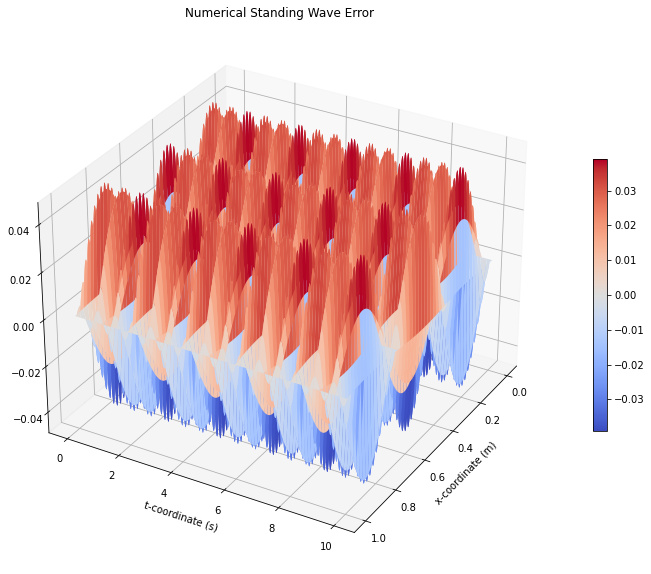

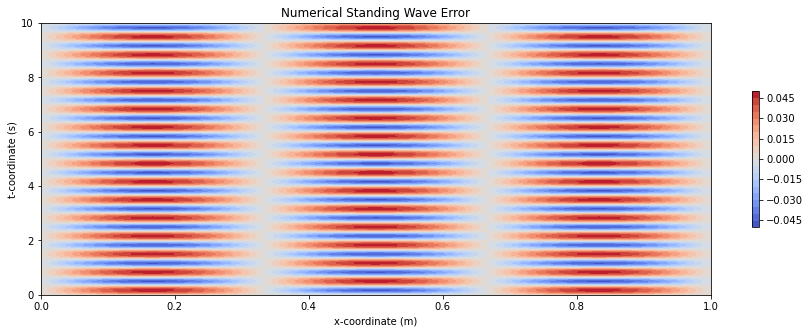

In [62]:
# Plots and animates numeric and analytic standing waves with amplitude 1, length 1, and harmonic 3
args2 = [1.0, 1.0, 10.0]
kwargs2 = {"harmonic" : 3, "Nxsteps" : 199, "Ntsteps" : 2000, "wave_speed" : 1.0, "save_stride" : 5}

mainPlot(1.0, 1.0, *args2, frames = 200, interval = 20, **kwargs2)

As can be seen in the first animation, especially when it is slowed down using the "-" sign, the difference between the numerical and analytic solutions is much more pronounced for a Courant number near $1$, as compared to the previous case of a relatively low Courant number. Additionally, unlike in the case for a low Courant number, in error animation, surface plot, and contour we see that the amplitude of the error wave remains relatively constant, with its maximum around $0.045$ being approximately ten times that of the low Courant wave at its highest amplitude of approximately $0.0045$. Thus, we are able to clearly see that as the Courant number approaches $1$ our numerical solution begins to fail, which is clearly observable even in the animation of the numerical and analytic solutions on the same plot.

## Conclusion